# Guangda Zhu (gz6xw@virginia.edu)

# DS 5001

# April 30 2020

In [1]:
import pandas as pd
import numpy as np
import urllib
import nltk
from nltk import sent_tokenize
from nltk import word_tokenize
from gensim.models import word2vec
from sklearn.manifold import TSNE
import plotly_express as px

In [12]:
# read in data and drop entries if doc_content is NULL
data1 = pd.read_csv('newzy.csv', sep ='|')
data1 = data1.dropna(subset=['doc_content'])
data1.head()

,doc_id,doc_source,doc_title,doc_content,doc_date,doc_url
0,39,Google News,"50 Years on, Finding Profit in 'Truth' on JFK ...","Washington Post50 Years on, Finding Profit in ...",11/03/2013,http://news.google.com/news/url?sa=t&fd=R&usg=...
1,38,Google News,"Nearly 10 years later, families and officials ...","Washington PostNearly 10 years later, families...",11/03/2013,http://news.google.com/news/url?sa=t&fd=R&usg=...
2,37,Google News,"Cuccinelli, running hard, has been hobbled in ...","Washington PostCuccinelli, running hard, has b...",11/03/2013,http://news.google.com/news/url?sa=t&fd=R&usg=...
3,36,Google News,Chuck Schumer endorses Hillary Clinton for Pre...,New York Daily NewsChuck Schumer endorses Hill...,11/03/2013,http://news.google.com/news/url?sa=t&fd=R&usg=...
4,35,Google News,Sec. Kerry issues apparent warning to Iran - C...,Ahram OnlineSec. Kerry issues apparent warning...,11/03/2013,http://news.google.com/news/url?sa=t&fd=R&usg=...


In [3]:
data.doc_source.unique()

array(['Google News', 'PowerLine', 'Reuters', 'Guardian', 'Daily Kos',
       'Drudge Report', 'Real Clear Politics', 'NPR', 'Fox',
       'New York Times', 'Breitbart', 'CNN', 'US News', 'UPI Latest',
       'Politico Magazine'], dtype=object)

In [4]:
#content does not include author name
data.loc[data.doc_source == 'Daily Kos'].head()

,doc_id,doc_source,doc_title,doc_content,doc_date,doc_url
70,96,Daily Kos,Obama has done nothing to address income inequ...,Income and wealth inequality is a festering wo...,11/03/2013,http://feeds.dailykos.com/~r/dailykos/index/~3...
71,97,Daily Kos,"Anti-racism is not 'anti-white,' no matter wha...",The virulent meme spread across our nation wit...,11/03/2013,http://feeds.dailykos.com/~r/dailykos/index/~3...
72,98,Daily Kos,Abbreviated Pundit Round-up: Angry does no...,Chrystia Freeland sees a fight that's not not ...,11/03/2013,http://feeds.dailykos.com/~r/dailykos/index/~3...
73,99,Daily Kos,Sunday Talk: Haters gonna hate,"No doubt, the bestest thing about America is o...",11/03/2013,http://feeds.dailykos.com/~r/dailykos/index/~3...
74,100,Daily Kos,Gore on fire: Says humans treating atmosphere ...,About time Al Gore has been everywhere lately....,11/03/2013,http://feeds.dailykos.com/~r/dailykos/index/~3...


In [17]:
DK = data1.loc[(data1['doc_source'] == 'Daily Kos')].sample(1000)
PL = data1.loc[(data1['doc_source'] == 'PowerLine')].sample(1000)
#remove author name from doc_content in PowerLine
PL.doc_content = PL.doc_content.apply(lambda x: str(x).strip(str(x).split(')')[0]).strip(')'))

In [22]:
data = DK.append(PL)
data = data.reset_index(drop = True)
data.head()

,doc_id,doc_source,doc_title,doc_content,doc_date,doc_url
0,262847,Daily Kos,Abbreviated Pundit Round-up: The erosion of no...,"EJ Dionne, Norm Orenstein, Thomas Mann/Atlanti...",09/20/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...
1,117595,Daily Kos,Chris Hayes' latest book examines the ongoing ...,What in the world is one supposed to do after ...,04/10/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...
2,40272,Daily Kos,Trump knows U.S. intelligence agencies are wro...,"On the one hand, U.S. intelligence agencies sa...",01/04/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...
3,60928,Daily Kos,Sen. Al Franken asked Republicans to do their ...,Sen. Al Franken spoke on the Senate floor on T...,02/07/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...
4,93772,Daily Kos,"Ignorant, unskilled, sick, hungry, cruel and v...",Donald Trump is out to find programs that Amer...,03/16/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...


In [23]:
# create year and month column
data['year'] = data.doc_date.apply(lambda x: x.split('/')[2])
data['month'] = data.doc_date.apply(lambda x: x.split('/')[0])

data.head(5)

,doc_id,doc_source,doc_title,doc_content,doc_date,doc_url,year,month
0,262847,Daily Kos,Abbreviated Pundit Round-up: The erosion of no...,"EJ Dionne, Norm Orenstein, Thomas Mann/Atlanti...",09/20/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...,2017,09
1,117595,Daily Kos,Chris Hayes' latest book examines the ongoing ...,What in the world is one supposed to do after ...,04/10/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...,2017,04
2,40272,Daily Kos,Trump knows U.S. intelligence agencies are wro...,"On the one hand, U.S. intelligence agencies sa...",01/04/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...,2017,01
3,60928,Daily Kos,Sen. Al Franken asked Republicans to do their ...,Sen. Al Franken spoke on the Senate floor on T...,02/07/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...,2017,02
4,93772,Daily Kos,"Ignorant, unskilled, sick, hungry, cruel and v...",Donald Trump is out to find programs that Amer...,03/16/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...,2017,03


In [25]:
data.sample(10)

,doc_id,doc_source,doc_title,doc_content,doc_date,doc_url,year,month
1031,971364,PowerLine,We now know: Devin Nunes reflects,In the aftermath of the Department of Justice...,12/24/2019,http://feeds.powerlineblog.com/~r/powerlineblo...,2019,12
1436,448697,PowerLine,Amy Wax speaks (YouTube edition),"We’ve written several times about Amy Wax, th...",04/19/2018,http://feeds.powerlineblog.com/~r/powerlineblo...,2018,04
849,236421,Daily Kos,Donald Trump announces his new Afghanistan str...,"Donald Trump, fresh off the golf course, gave ...",08/22/2017,http://feeds.dailykos.com/~r/dailykos/index/~3...,2017,08
1608,469981,PowerLine,Pompeo and circumstance,Secretary of State Mike Pompeo appeared for a...,05/13/2018,http://feeds.powerlineblog.com/~r/powerlineblo...,2018,05
1321,333852,PowerLine,Will Bitcoin Destroy the World?,I have to admit that I don’t understand bitco...,12/07/2017,http://feeds.powerlineblog.com/~r/powerlineblo...,2017,12
1325,1005921,PowerLine,From Paul Sperry’s notebook,Behind the impeachment of President Trump li...,02/02/2020,http://feeds.powerlineblog.com/~r/powerlineblo...,2020,02
873,26152,Daily Kos,Midday open thread: Trump could wreck Obama's ...,Today’s comic by Matt Bors is Trump's new powe...,11/23/2016,http://feeds.dailykos.com/~r/dailykos/index/~3...,2016,11
1589,550716,PowerLine,Another Keith Ellison Sexual Assault Charge,"A guy named Jeff Kolb, who is a city councilm...",08/14/2018,http://feeds.powerlineblog.com/~r/powerlineblo...,2018,08
153,611903,Daily Kos,"Whiny Pennsylvania Republican wants—nay, deman...",Rep. Brian Fitzpatrick is putting on a full-co...,10/31/2018,http://feeds.dailykosmedia.com/~r/dailykos/ind...,2018,10
1609,1022255,PowerLine,Did the Astros cheat in 2019?,In the first inning of Game One the 2019 Worl...,02/21/2020,http://feeds.powerlineblog.com/~r/powerlineblo...,2020,02


# Create Tables

#### LIB table

In [27]:
LIB = data[['doc_id','doc_title','year','month', 'doc_source']].set_index('doc_id')
LIB.sample(5)

,doc_title,year,month,doc_source
doc_id,,,,
121272,Suburban Republicans have a sad about their pa...,2017,04,Daily Kos
940381,Dems mull Mueller impeachment count,2019,11,PowerLine
97119,Does the Trump-Putin collusion claim make sense?,2017,03,PowerLine
5193,Scott Walker sold Wisconsin out to the highest...,2016,09,Daily Kos
232038,Morning Digest: Court ruling striking down Tex...,2017,08,Daily Kos


#### DOC table

In [28]:
# DOC table, split each content into sentence level
df = data.doc_content.apply(lambda x: pd.Series(nltk.sent_tokenize(str(x))))
DOC = df.set_index(data.doc_id).stack().to_frame().rename(columns={0:'sent_str'})
DOC.head()

sent_str
doc_id                                                     
262847 0  EJ Dionne, Norm Orenstein, Thomas Mann/Atlanti...
       1  Norms are defined as “a standard or pattern, e...
       2  We don’t fully appreciate the power of norms u...
       3  And the breaching of norms often produces a ca...
       4  Donald Trump is the Normless President, and hi...

#### TOKEN table

In [29]:
TOKEN = DOC.sent_str.apply(lambda x: pd.Series(nltk.pos_tag(nltk.word_tokenize(x))))
TOKEN = TOKEN.stack().to_frame().rename(columns = {0:'pos_tuple'})
TOKEN['pos'] = TOKEN.pos_tuple.apply(lambda x: x[1])
TOKEN['token_str'] = TOKEN.pos_tuple.apply(lambda x: x[0])
TOKEN.index.names = ['doc_id','sent_num','token_num']

In [30]:
TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')#remove anything that's not words
TOKEN.term_str = TOKEN.term_str.replace('',np.NaN)
TOKEN = TOKEN[~TOKEN.term_str.isna()]
TOKEN.head() #can have duplicate vocab

pos_tuple  pos  token_str   term_str
doc_id sent_num token_num                                             
262847 0        0                 (EJ, NNP)  NNP         EJ         ej
                1             (Dionne, NNP)  NNP     Dionne     dionne
                3               (Norm, NNP)  NNP       Norm       norm
                4          (Orenstein, NNP)  NNP  Orenstein  orenstein
                6             (Thomas, NNP)  NNP     Thomas     thomas

#### VOCAB table

In [31]:
#count the value for each term from TOKEN table
VOCAB = TOKEN.term_str.value_counts().to_frame()\
    .rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

In [32]:
# num = 1 if the term is number
VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')
VOCAB.head()

,term_str,n,num
term_id,,,
0,0,7,1
1,0000,64,1
2,001,2,1
3,01,3,1
4,02,2,1


### Annotate(VOCAB)

In [33]:
#stopwords
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1
sw.sample(10)

,dummy
term_str,
her,1
herself,1
above,1
couldn,1
aren,1
and,1
off,1
you,1
in,1


In [34]:
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

In [35]:
VOCAB[VOCAB.stop == 1]

,term_str,n,num,stop
term_id,,,,
1491,a,16343,0,1
1573,about,2530,0,1
1577,above,110,0,1
2039,after,962,0,1
2054,again,343,0,1
...,...,...,...,...
35128,you,2737,0,1
35139,your,643,0,1
35140,yours,10,0,1


#### Add Stems

In [36]:
from nltk.stem.porter import PorterStemmer
stemmer1 = PorterStemmer()
VOCAB['stem_porter'] = VOCAB.term_str.apply(stemmer1.stem)

from nltk.stem.snowball import SnowballStemmer
stemmer2 = SnowballStemmer("english")
VOCAB['stem_snowball'] = VOCAB.term_str.apply(stemmer2.stem)

from nltk.stem.lancaster import LancasterStemmer
stemmer3 = LancasterStemmer()
VOCAB['stem_lancaster'] = VOCAB.term_str.apply(stemmer3.stem)

In [37]:
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)
TOKEN.head()

pos_tuple  pos  token_str   term_str  \
doc_id sent_num token_num                                                
262847 0        0                 (EJ, NNP)  NNP         EJ         ej   
                1             (Dionne, NNP)  NNP     Dionne     dionne   
                3               (Norm, NNP)  NNP       Norm       norm   
                4          (Orenstein, NNP)  NNP  Orenstein  orenstein   
                6             (Thomas, NNP)  NNP     Thomas     thomas   

                           term_id  
doc_id sent_num token_num           
262847 0        0            10807  
                1             9610  
                3            21572  
                4            22334  
                6            31593

In [38]:
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)
VOCAB.sample(5)

,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max
term_id,,,,,,,,
21548,nonus,1,0,0,nonu,nonus,non,JJ
11368,equated,1,0,0,equat,equat,equ,VBD
33713,vigil,1,0,0,vigil,vigil,vigil,NN
20674,mouthpieces,1,0,0,mouthpiec,mouthpiec,mouthpiec,NNS
9612,dioxideit,1,0,0,dioxideit,dioxideit,dioxideit,NN


In [39]:
LIB.to_csv('LIB.csv')
DOC.to_csv('DOC.csv')
TOKEN.to_csv('TOKEN.csv')
VOCAB.to_csv('VOCAB.csv')

# TFIDF

In [18]:
TOKEN = pd.read_csv('TOKEN.csv')
VOCAB = pd.read_csv('VOCAB.csv')

In [19]:
def TFIDF(TOKEN, bag, tf_method, idf_method, count_method, count_item):
    TOKEN = TOKEN[~TOKEN.term_str.isna()]
    TOKEN['stem_porter'] = TOKEN.term_id.map(VOCAB.stem_porter)
    
    if count_item == 'term':
        print('term')
        BOW = TOKEN.groupby(bag+['term_id']).term_id.count().to_frame().rename(columns={'term_id':'n'})
        BOW['c'] = BOW.n.astype('bool').astype('int')
        
    else: #stem
        BOW = TOKEN.groupby(bag+['stem_porter']).stem_porter.count().to_frame().rename(columns={'stem_porter':'n'})
        BOW['c'] = BOW.n.astype('bool').astype('int')
    
    DTCM = BOW[count_method].unstack().fillna(0).astype('int')
    print('dtcm')
    if tf_method == 'sum':
        print('sum')
        TF = DTCM.T / DTCM.T.sum()

    elif tf_method == 'max':
        TF = DTCM.T / DTCM.T.max()

    elif tf_method == 'log':
        TF = np.log10(1 + DTCM.T)

    elif tf_method == 'raw':
        TF = DTCM.T

    elif tf_method == 'double_norm':
        TF = DTCM.T / DTCM.T.max()
        TF = 0.5 + (1 - 0.5) * TF[TF > 0] #switched tf_norm_k out as 0.5

    elif tf_method == 'binary':
        TF = DTCM.T.astype('bool').astype('int')
        
    print('done sum')
    TF = TF.T
    print('tf')

    DF = DTCM[DTCM > 0].count()
    print('idf')
    # compute IDF
    N = DTCM.shape[0]
    if idf_method == 'standard':
        print('standard')
        IDF = np.log10(N / DF)

    elif idf_method == 'max':
        IDF = np.log10(DF.max() / DF) 

    elif idf_method == 'smooth':
        IDF = np.log10((1 + N) / (1 + DF))

    print('multiply')
    TFIDF = TF * IDF
    print('BOW')
    BOW['tf'] = TF.stack()
    BOW['tfidf'] = TFIDF.stack()
    
    return TFIDF, DF, IDF, BOW

In [20]:
OHCO = ['doc_id', 'sent_num', 'token_num']

BAG = OHCO[:1]
TFIDF, DF, IDF, BOW=TFIDF(TOKEN, BAG, 'sum', 'standard', 'n', 'term')
TFIDF.head()

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



term
dtcm
sum
done sum
tf
idf
standard
multiply
BOW


term_id,0,1,2,3,4,5,6,7,8,9,...,35302,35303,35304,35305,35306,35307,35308,35309,35310,35311
doc_id,,,,,,,,,,,,,,,,,,,,,
106,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
114,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1412,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [42]:
TFIDF.shape #(22037, 79237)

(2000, 35312)

In [24]:
TFIDF.head()

term_id,0,1,2,3,4,5,6,7,8,9,...,35302,35303,35304,35305,35306,35307,35308,35309,35310,35311
doc_id,,,,,,,,,,,,,,,,,,,,,
106,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
114,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1412,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [43]:
TFIDF.to_csv('TFIDF.csv')
DF.to_csv('DF.csv')
IDF.to_csv('IDF.csv')
BOW.to_csv('BOW.csv')

In [22]:
VOCAB['df'] = DF
VOCAB['idf'] = IDF
VOCAB['tfidf_sum'] = TFIDF.sum()
VOCAB.head()

,term_id,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,df,idf,tfidf_sum
0,0,0,7,1,0,0,0,0,CD,6.0,2.522879,0.055015
1,1,0000,64,1,0,0000,0000,0000,NNP,30.0,1.823909,0.433110
2,2,001,2,1,0,001,001,001,CD,2.0,3.000000,0.018646
3,3,01,3,1,0,01,01,01,CD,3.0,2.823909,0.019851
4,4,02,2,1,0,02,02,02,CD,2.0,3.000000,0.020308


In [23]:
#top 20 words in the corpus by TFIDF sum (excluding stop words)
## words with bag of 'doc_id'
VOCAB.loc[VOCAB.stop == 0].sort_values('tfidf_sum', ascending=False).head(20).style.background_gradient(cmap='YlGn', high=1)



,term_id,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,df,idf,tfidf_sum
34881,34881,wwwpatreoncomkeefknight,5,0,0,wwwpatreoncomkeefknight,wwwpatreoncomkeefknight,wwwpatreoncomkeefknight,NN,5.000000,2.602060,9.107210
32366,32366,trump,5131,0,0,trump,trump,trump,NNP,1165.000000,0.234704,3.476885
32584,32584,twitter,172,0,0,twitter,twitter,twit,NNP,131.000000,1.183759,3.114738
12859,12859,follow,106,0,0,follow,follow,follow,VB,100.000000,1.301030,3.094673
17156,17156,jensorensen,9,0,0,jensorensen,jensorensen,jensorens,NNP,9.000000,2.346787,2.401476
17147,17147,jen,13,0,0,jen,jen,jen,NNP,13.000000,2.187087,2.254111
19562,19562,mattbors,10,0,0,mattbor,mattbor,mattb,NNPS,10.000000,2.301030,1.962007
15425,15425,house,1149,0,0,hous,hous,hous,NNP,573.000000,0.542875,1.856571
24496,24496,president,1657,0,0,presid,presid,presid,NNP,788.000000,0.404504,1.824798
34406,34406,white,882,0,0,white,white,whit,NNP,428.000000,0.669586,1.777082


In [25]:
VOCAB.to_csv('VOCAB.csv')

In [ ]:
LIB = pd.read_csv('LIB.csv').set_index('doc_id')
DOC = pd.read_csv('DOC.csv').set_index(['doc_id','sent_num'])
TOKEN = pd.read_csv('TOKEN.csv').set_index(OHCO)
VOCAB = pd.read_csv('VOCAB.csv').set_index('term_id')

In [2]:
TFIDF = pd.read_csv('TFIDF.csv').set_index('doc_id')

# PCA

In [26]:
tfidf = TFIDF.copy()

In [27]:
tfidf_top = VOCAB.tfidf_sum.nlargest(5000)

In [28]:
top_list = list(tfidf_top.index)

In [29]:
len(TFIDF)

2000

In [30]:
tfidf = tfidf.loc[:,tfidf.columns.isin(top_list)]
tfidf

term_id,1,17,18,19,20,21,22,66,110,161,...,35136,35139,35141,35143,35146,35230,35245,35257,35271,35295
doc_id,,,,,,,,,,,,,,,,,,,,,
106,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.006650,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
107,0.0,0.000662,0.0,0.0,0.0,0.001334,0.0,0.0,0.0,0.000000,...,0.0,0.000950,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
114,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
125,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1412,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1022255,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.000728,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1022567,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1023312,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.002521,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## PCA on Reduced TFIDF

In [31]:
tfidf = tfidf.apply(lambda x: x / np.sqrt(np.square(x).sum()), 1)

In [32]:
tfidf = tfidf - tfidf.mean()

In [33]:
COV = tfidf.T.dot(tfidf) / (tfidf.shape[0] - 1)

In [34]:
COV.head()

term_id,1,17,18,19,20,21,22,66,110,161,...,35136,35139,35141,35143,35146,35230,35245,35257,35271,35295
term_id,,,,,,,,,,,,,,,,,,,,,
1,0.000435,-0.000006,3.297783e-05,-1.363990e-06,-1.695007e-06,7.555120e-06,-0.000001,0.000020,0.000014,0.000046,...,-1.359818e-06,-0.000010,-2.500689e-06,-2.039434e-06,-0.000004,-9.386700e-07,-2.632345e-06,-0.000003,-1.768220e-06,9.974774e-06
17,-0.000006,0.000186,1.352636e-05,-3.442222e-06,-1.644981e-06,-1.068735e-06,0.000002,0.000014,0.000006,-0.000002,...,-2.466784e-06,0.000004,2.582193e-06,7.550018e-06,-0.000001,-1.702799e-06,4.795127e-09,-0.000001,-2.617130e-07,-1.844467e-06
18,0.000033,0.000014,1.892980e-04,1.644241e-06,-9.593525e-07,-1.477270e-07,0.000004,0.000004,0.000009,-0.000002,...,-7.334807e-07,0.000007,1.227762e-06,9.313535e-07,0.000008,-1.500124e-06,6.588956e-06,0.000020,-2.175480e-06,5.953463e-06
19,-0.000001,-0.000003,1.644241e-06,2.621212e-04,5.922350e-08,6.427945e-06,0.000002,0.000018,-0.000005,-0.000003,...,-1.512651e-06,0.000001,1.437736e-06,-1.517154e-06,0.000004,3.309328e-06,5.031449e-06,-0.000003,-1.966955e-06,5.335934e-06
20,-0.000002,-0.000002,-9.593525e-07,5.922350e-08,9.473471e-05,-6.947950e-07,0.000013,0.000022,0.000005,0.000002,...,-5.035255e-07,-0.000005,-9.259776e-07,-7.551800e-07,-0.000002,-3.475792e-07,1.948459e-06,-0.000001,3.230742e-06,-3.764968e-07


In [35]:
from scipy.linalg import eigh 

In [36]:
eig_vals, eig_vecs = eigh(COV)

In [37]:
TERM_IDX = COV.index

In [38]:
EIG_VEC = pd.DataFrame(eig_vecs, index=TERM_IDX, columns=TERM_IDX)

In [39]:
EIG_VAL = pd.DataFrame(eig_vals, index=TERM_IDX, columns=['eig_val'])
EIG_VAL.index.name = 'term_id'

In [40]:
EIG_VEC.iloc[:5, :10].style.background_gradient()

term_id,1,17,18,19,20,21,22,66,110,161
term_id,,,,,,,,,,
1,-0.031499,-0.004218,0.027622,0.155732,-0.061779,-0.005316,0.037963,-0.037008,0.047590,-0.047956
17,-0.002513,0.013946,0.006276,0.050262,-0.033822,-0.015163,0.036445,-0.011962,0.006754,-0.038792
18,0.016811,0.011581,-0.076375,-0.290147,0.104276,0.064179,-0.110005,-0.025704,0.029884,0.079837
19,0.008924,-0.022191,0.048609,0.170183,-0.060091,-0.055856,0.061997,0.049556,-0.087186,-0.014240
20,0.006073,0.001463,-0.007522,0.059818,-0.049958,-0.056256,0.038089,-0.114868,-0.001033,0.056997


In [41]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)

In [42]:
EIG_PAIRS.head() #term id as component. each row is components

,eig_val,1,17,18,19,20,21,22,66,110,...,35136,35139,35141,35143,35146,35230,35245,35257,35271,35295
term_id,,,,,,,,,,,,,,,,,,,,,
1,-4.443824e-18,-0.031499,-0.002513,0.016811,0.008924,0.006073,-0.034139,-0.095093,-0.058155,-0.079461,...,-0.003392,-0.002191,-0.007565,0.000729,0.009976,-0.001110,-0.001265,-0.010885,0.004625,-0.004680
17,-3.274940e-18,-0.004218,0.013946,0.011581,-0.022191,0.001463,0.012102,0.007300,-0.017687,-0.051134,...,0.009811,0.009053,0.007977,-0.016884,-0.009146,-0.012708,-0.010045,-0.011204,0.004435,-0.017756
18,-3.152920e-18,0.027622,0.006276,-0.076375,0.048609,-0.007522,-0.003443,0.014613,-0.009145,0.010019,...,-0.000903,0.013501,0.026971,-0.046035,-0.007253,-0.003228,-0.001218,0.014386,-0.007849,0.013446
19,-2.936690e-18,0.155732,0.050262,-0.290147,0.170183,0.059818,0.097619,0.113969,0.086220,0.081410,...,-0.006592,0.034412,-0.000002,0.017329,-0.014749,0.001333,0.004819,-0.012637,-0.012023,-0.006048
20,-2.898083e-18,-0.061779,-0.033822,0.104276,-0.060091,-0.049958,-0.080223,-0.052864,-0.063343,-0.037185,...,-0.006648,-0.014352,0.011342,0.033547,0.009994,0.005572,0.009010,0.022069,0.002593,-0.009509


In [43]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

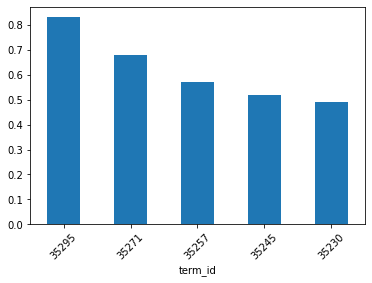

In [44]:
EIG_PAIRS.exp_var.sort_values(ascending=False).head().plot.bar(rot=45) #first three component might be interesting!

In [45]:
COMPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
COMPS.index.name = 'comp_id'
COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]

In [46]:
COMPS

,eig_val,1,17,18,19,20,21,22,66,110,...,35139,35141,35143,35146,35230,35245,35257,35271,35295,exp_var
PC0,0.008040,0.015537,-0.008387,-0.014289,-0.004616,-0.004649,-0.004594,-0.001282,-0.004498,-0.002258,...,-0.040619,-0.004844,-0.005045,-0.021502,0.000547,0.000477,-0.003278,-0.001397,-0.001164,0.83
PC1,0.006609,0.010737,0.009114,0.011275,0.001859,-0.001887,-0.001389,0.001731,0.005912,0.004055,...,0.004850,-0.001731,-0.001035,0.005412,-0.003763,0.002965,0.000034,-0.003958,0.003010,0.68
PC2,0.005516,-0.006766,0.005216,0.003477,0.002940,0.001732,0.004194,-0.000098,0.003374,0.003855,...,0.045600,0.012078,0.002776,0.043093,0.000255,0.000981,-0.003237,0.002477,-0.002684,0.57
PC3,0.004999,0.004349,0.000776,-0.002910,0.001687,0.000173,-0.002953,0.001700,-0.002175,-0.007152,...,-0.118390,-0.020215,0.003657,-0.102426,0.005778,0.001936,0.013978,0.002397,0.000814,0.52
PC4,0.004725,-0.002285,0.008331,-0.006998,-0.011071,-0.005007,-0.000746,-0.001325,-0.013183,-0.005298,...,-0.025127,-0.001366,-0.001242,-0.064290,-0.005296,-0.006205,-0.011059,-0.009687,-0.000822,0.49
PC5,0.004320,-0.000701,0.008804,0.001816,-0.003125,0.001073,-0.004169,0.001695,0.003961,0.002362,...,-0.029097,-0.005299,-0.000023,-0.049327,-0.009729,0.001978,0.000739,-0.001469,-0.000966,0.45
PC6,0.004044,-0.023804,-0.003944,-0.006656,0.000752,-0.001404,0.001085,0.000332,-0.012527,-0.012791,...,0.001083,0.000227,0.007096,-0.059037,0.002657,0.000891,-0.006994,-0.001830,0.001129,0.42
PC7,0.003923,0.000515,0.008185,0.013521,0.003172,0.002043,0.005828,0.001885,-0.002896,0.008113,...,0.037185,0.004490,0.005580,0.038407,-0.009108,-0.004460,-0.008601,-0.007246,-0.003670,0.41
PC8,0.003675,0.013067,-0.016156,-0.016620,-0.002453,-0.007112,-0.006609,0.000881,-0.002757,-0.022822,...,-0.030879,0.004894,0.001650,-0.073079,0.000704,-0.004527,-0.009025,-0.004052,0.000959,0.38
PC9,0.003631,-0.054779,0.008184,0.007632,0.006998,-0.002513,0.004458,0.001371,0.001987,-0.009368,...,-0.024188,0.002768,0.006730,-0.030316,0.004695,0.004452,-0.006225,-0.002298,-0.003900,0.38


In [47]:
LOADINGS = COMPS[TERM_IDX].T
LOADINGS.index.name = 'term_id'

In [48]:
LOADINGS.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
1,0.015537,0.010737,-0.006766,0.004349,-0.002285,-0.000701,-0.023804,0.000515,0.013067,-0.054779
17,-0.008387,0.009114,0.005216,0.000776,0.008331,0.008804,-0.003944,0.008185,-0.016156,0.008184
18,-0.014289,0.011275,0.003477,-0.002910,-0.006998,0.001816,-0.006656,0.013521,-0.016620,0.007632
19,-0.004616,0.001859,0.002940,0.001687,-0.011071,-0.003125,0.000752,0.003172,-0.002453,0.006998
20,-0.004649,-0.001887,0.001732,0.000173,-0.005007,0.001073,-0.001404,0.002043,-0.007112,-0.002513


In [49]:
LOADINGS['term_str'] = LOADINGS.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)

In [50]:
LOADINGS.head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,term_str
term_id,,,,,,,,,,,
1,0.015537,0.010737,-0.006766,0.004349,-0.002285,-0.000701,-0.023804,0.000515,0.013067,-0.054779,0000
17,-0.008387,0.009114,0.005216,0.000776,0.008331,0.008804,-0.003944,0.008185,-0.016156,0.008184,1
18,-0.014289,0.011275,0.003477,-0.002910,-0.006998,0.001816,-0.006656,0.013521,-0.016620,0.007632,10
19,-0.004616,0.001859,0.002940,0.001687,-0.011071,-0.003125,0.000752,0.003172,-0.002453,0.006998,100
20,-0.004649,-0.001887,0.001732,0.000173,-0.005007,0.001073,-0.001404,0.002043,-0.007112,-0.002513,1000


In [51]:
LOADINGS.to_csv('LOADINGS.csv')

In [75]:
l0_pos = LOADINGS.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ') #words associate with positive value
l0_neg = LOADINGS.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ') #with negative value
l1_pos = LOADINGS.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')
l1_neg = LOADINGS.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')

In [76]:
print('docs PC0+', l0_pos)
print('docs PC0-', l0_neg)
print('docs PC1+', l1_pos)
print('docs PC1-', l1_neg)

docs PC0+ health obamacare bill care insurance republicans medicaid tax percent you
docs PC0- fbi comey investigation mueller russian russia intelligence flynn nunes trump
docs PC1+ mattbors follow twitter facebook she her omar my me jensorensen
docs PC1- republicans obamacare bill senate health care comey house republican medicaid


In [52]:
DCM = tfidf.dot(COMPS[TERM_IDX].T)

In [53]:
DCM #every document has distribution of component

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_id,,,,,,,,,,
106,-0.127335,0.097667,-0.041668,-0.065389,-0.025579,-0.012862,0.110280,0.054181,-0.070800,0.006262
107,-0.068553,0.041456,0.094376,-0.039968,-0.027389,0.092745,0.048784,0.117005,0.041241,0.150556
114,-0.031534,0.056415,0.004115,0.001450,-0.053929,-0.005974,-0.035299,0.022163,-0.080973,0.032353
125,-0.057709,0.020260,-0.017350,0.029417,0.007315,0.013367,-0.045245,0.033977,-0.005989,-0.015713
1412,-0.021597,-0.021324,-0.029488,0.052559,0.015208,-0.014855,-0.066456,0.006657,-0.001250,-0.047946
...,...,...,...,...,...,...,...,...,...,...
1022255,-0.018057,-0.028372,0.019202,0.000218,-0.001537,0.003288,-0.033373,-0.015532,-0.039193,-0.054634
1022567,-0.011475,-0.157866,0.084640,-0.064961,0.315421,0.040168,0.170209,-0.207858,-0.197980,0.018253
1023312,0.038611,-0.050757,0.067128,-0.051835,0.039391,-0.015001,0.025164,-0.027044,0.022177,0.022705


In [79]:
#Join back with the LIB table to get the doc information
DCM = DCM.join(LIB[['year','doc_source','month']], on='doc_id') 

In [80]:
DCM

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,year,doc_source,month
doc_id,,,,,,,,,,,,,
262847,-0.009278,-0.030282,0.005143,0.015618,-0.012644,0.006393,-0.014318,0.007425,0.008870,-0.017651,2017,Daily Kos,09
117595,-0.014834,-0.045055,0.023778,0.019125,-0.046142,-0.002886,0.014724,-0.018179,0.006304,-0.015009,2017,Daily Kos,04
40272,0.134839,0.038966,-0.001728,-0.012370,-0.022491,0.044351,-0.025023,0.108612,0.011525,0.014971,2017,Daily Kos,01
60928,-0.034678,-0.001968,0.020790,-0.011155,0.031745,0.022585,-0.028441,-0.013796,0.069954,-0.003412,2017,Daily Kos,02
93772,-0.078153,0.044979,-0.027075,0.030279,-0.079674,-0.019360,0.078146,0.001791,-0.041760,0.008104,2017,Daily Kos,03
...,...,...,...,...,...,...,...,...,...,...,...,...,...
220417,-0.012844,-0.052485,0.050223,-0.048910,-0.019720,0.021351,0.049629,-0.022360,0.033685,-0.001850,2017,PowerLine,08
727680,0.013556,-0.054417,-0.005985,0.010650,-0.003654,-0.031806,0.005390,-0.088228,0.039668,0.071186,2019,PowerLine,03
678085,0.451645,0.124284,-0.029201,-0.083983,0.027854,-0.027005,0.022373,-0.093047,-0.125236,0.097880,2019,PowerLine,01


In [81]:
DCM['doc'] = DCM.apply(lambda x: "{}-{}".format(str(x.year), x.doc_source), 1)

In [83]:
DCM.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,year,doc_source,month,doc
doc_id,,,,,,,,,,,,,,
262847,-0.009278,-0.030282,0.005143,0.015618,-0.012644,0.006393,-0.014318,0.007425,0.008870,-0.017651,2017,Daily Kos,09,2017-Daily Kos
117595,-0.014834,-0.045055,0.023778,0.019125,-0.046142,-0.002886,0.014724,-0.018179,0.006304,-0.015009,2017,Daily Kos,04,2017-Daily Kos
40272,0.134839,0.038966,-0.001728,-0.012370,-0.022491,0.044351,-0.025023,0.108612,0.011525,0.014971,2017,Daily Kos,01,2017-Daily Kos
60928,-0.034678,-0.001968,0.020790,-0.011155,0.031745,0.022585,-0.028441,-0.013796,0.069954,-0.003412,2017,Daily Kos,02,2017-Daily Kos
93772,-0.078153,0.044979,-0.027075,0.030279,-0.079674,-0.019360,0.078146,0.001791,-0.041760,0.008104,2017,Daily Kos,03,2017-Daily Kos


In [88]:
DCM.to_csv('DCM.csv')

In [4]:
def vis_pcs_source(M, a, b, label='doc_source', prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color=label, 
                        hover_name='doc', marginal_x='box')
    fig.show()

In [5]:
def vis_pcs_year(M, a, b, label='year', prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color=label, 
                        hover_name='doc', marginal_x='box')
    fig.show()

In [6]:
def vis_pcs_month(M, a, b, label='month', prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color=label, 
                        hover_name='doc', marginal_x='box')
    fig.show()

In [3]:
DCM = pd.read_csv('./ETA-data/PCA/DCM.csv')

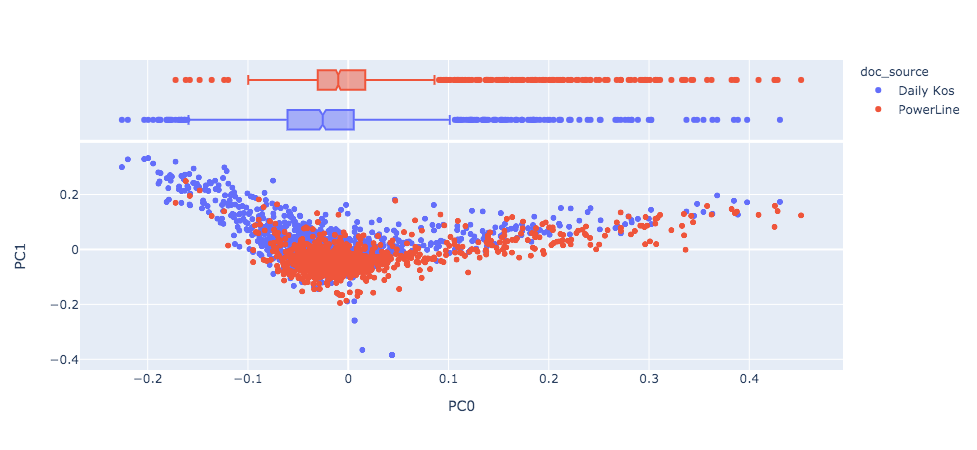

In [87]:
vis_pcs_source(DCM, 0, 1)

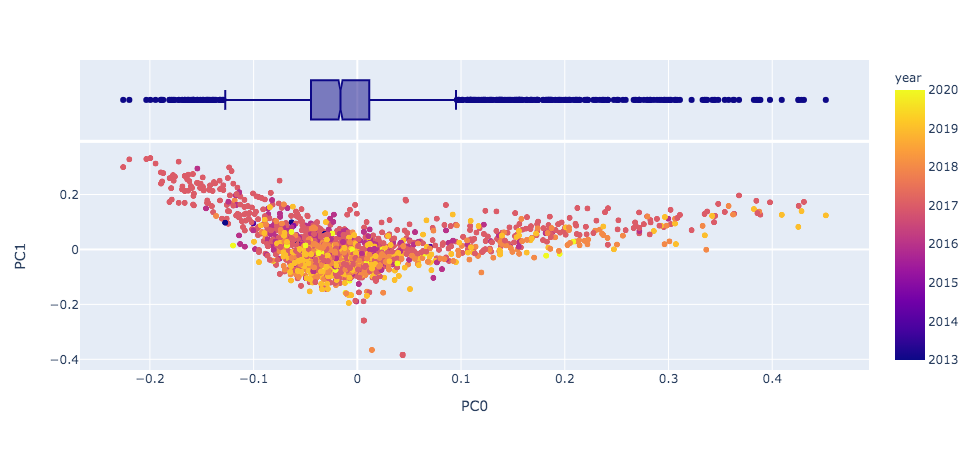

In [7]:
vis_pcs_year(DCM, 0, 1)

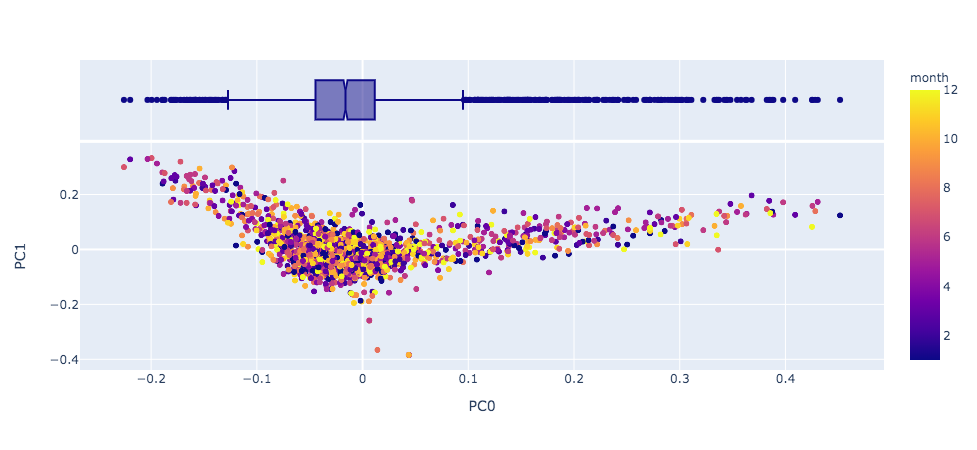

In [8]:
vis_pcs_month(DCM, 0, 1)

# Sentiment Analysis

In [54]:
SALEX = pd.read_csv('salex_nrc.csv').set_index('term_str')
SALEX.columns = [col.replace('nrc_','') for col in SALEX.columns]
SALEX['polarity'] = SALEX.positive - SALEX.negative
SALEX.head()

,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_str,,,,,,,,,,,
abandon,0,0,0,1,0,1,0,1,0,0,-1
abandoned,1,0,0,1,0,1,0,1,0,0,-1
abandonment,1,0,0,1,0,1,0,1,1,0,-1
abduction,0,0,0,1,0,1,0,1,1,0,-1
aberration,0,0,1,0,0,1,0,0,0,0,-1


In [55]:
BOW = BOW.reset_index()
BOW

,doc_id,term_id,n,c,tf,tfidf
0,106,897,1,1,0.002283,0.004345
1,106,1491,5,1,0.011416,0.000189
2,106,1551,1,1,0.002283,0.002492
3,106,1634,1,1,0.002283,0.004920
4,106,1684,1,1,0.002283,0.002757
...,...,...,...,...,...,...
421334,1023934,34614,1,1,0.002020,0.002491
421335,1023934,34671,1,1,0.002020,0.003957
421336,1023934,34783,2,1,0.004040,0.001239
421337,1023934,35074,1,1,0.002020,0.001168


In [56]:
BOW['term_str'] = BOW.term_id.map(VOCAB.term_str)
BOW

,doc_id,term_id,n,c,tf,tfidf,term_str
0,106,897,1,1,0.002283,0.004345,36
1,106,1491,5,1,0.011416,0.000189,a
2,106,1551,1,1,0.002283,0.002492,able
3,106,1634,1,1,0.002283,0.004920,academy
4,106,1684,1,1,0.002283,0.002757,account
...,...,...,...,...,...,...,...
421334,1023934,34614,1,1,0.002020,0.002491,within
421335,1023934,34671,1,1,0.002020,0.003957,wondering
421336,1023934,34783,2,1,0.004040,0.001239,would
421337,1023934,35074,1,1,0.002020,0.001168,years


In [57]:
BOW = BOW.set_index(['doc_id','term_id'])

In [58]:
V = pd.concat([VOCAB.reset_index().set_index('term_str'), SALEX], join='inner', axis=1)\
    .reset_index().set_index('term_id')

In [59]:
V.head()

,term_str,index,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,df,...,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_id,,,,,,,,,,,,,,,,,,,,,
1505,abandon,1505,17,0,0,abandon,abandon,abandon,VB,14.0,...,0,0,1,0,1,0,1,0,0,-1
1506,abandoned,1506,15,0,0,abandon,abandon,abandon,VBN,15.0,...,0,0,1,0,1,0,1,0,0,-1
1508,abandonment,1508,3,0,0,abandon,abandon,abandon,NN,3.0,...,0,0,1,0,1,0,1,1,0,-1
1533,aberration,1533,1,0,0,aberr,aberr,aber,NN,1.0,...,0,1,0,0,1,0,0,0,0,-1
1539,abhor,1539,1,0,0,abhor,abhor,abh,NN,1.0,...,0,1,1,0,1,0,0,0,0,-1


In [60]:
emo_cols = "anger anticipation surprise trust polarity".split()

In [61]:
BOW

n  c        tf     tfidf   term_str
doc_id  term_id                                     
106     897      1  1  0.002283  0.004345         36
        1491     5  1  0.011416  0.000189          a
        1551     1  1  0.002283  0.002492       able
        1634     1  1  0.002283  0.004920    academy
        1684     1  1  0.002283  0.002757    account
...             .. ..       ...       ...        ...
1023934 34614    1  1  0.002020  0.002491     within
        34671    1  1  0.002020  0.003957  wondering
        34783    2  1  0.004040  0.001239      would
        35074    1  1  0.002020  0.001168      years
        35104    1  1  0.002020  0.001673        yet

[421339 rows x 5 columns]

In [62]:
BOWIDX = BOW.index
B = BOW.merge(V, on='term_str', how='left')
B.index = BOWIDX
B = B.dropna()

bcols = ['n_x', 'tf', 'tfidf', 'term_str', 'n_y', 'num', 'pos_max', 
'tfidf_sum', 'anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive', 'sadness', 'surprise', 'trust', 'polarity']

B = B[bcols]

for col in emo_cols:
    B[col] = B[col] * B.tfidf

In [63]:
B.head()

n_x        tf     tfidf term_str   n_y  num pos_max  \
doc_id term_id                                                        
106    5684       1  0.002283  0.004851      cap  16.0  0.0      NN   
       8120       1  0.002283  0.003310   create  82.0  0.0      VB   
       11230      1  0.002283  0.006849   enroll   2.0  0.0      VB   
       12101      1  0.002283  0.003310     fall  77.0  0.0      NN   
       12361      2  0.004566  0.006857   fellow  73.0  0.0      JJ   

                tfidf_sum  anger  anticipation  disgust  fear  joy  negative  \
doc_id term_id                                                                 
106    5684      0.091231    0.0      0.004851      0.0   0.0  0.0       0.0   
       8120      0.326369    0.0      0.000000      0.0   0.0  1.0       0.0   
       11230     0.012178    0.0      0.006849      0.0   0.0  0.0       0.0   
       12101     0.263155    0.0      0.000000      0.0   0.0  0.0       1.0   
       12361     0.276679    0.0      0.000000      0.0   0.0  0.0       0.0   

                positive  sadness  surprise     trust  polarity  
doc_id term_id                                                   
106    5684          0.0      0.0       0.0  0.004851  0.000000  
       8120          1.0      0.0       0.0  0.000000  0.003310  
       11230         0.0      0.0       0.0  0.006849  0.000000  
       12101         0.0      1.0       0.0  0.000000 -0.003310  
       12361         1.0      0.0       0.0  0.006857  0.006857

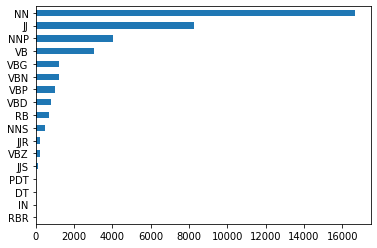

In [64]:
B.pos_max.value_counts().sort_values().plot.barh()

In [65]:
B = B.reset_index()

In [67]:
LIB = pd.read_csv('LIB.csv')

In [68]:
B['year'] =  B.doc_id.map(LIB.year)
B['month'] = B.doc_id.map(LIB.month)
B['source'] = B.doc_id.map(LIB.doc_source)
B = B.set_index(['doc_id','term_id'])
B

n_x        tf     tfidf    term_str    n_y  num pos_max  \
doc_id  term_id                                                            
106     5684       1  0.002283  0.004851         cap   16.0  0.0      NN   
        8120       1  0.002283  0.003310      create   82.0  0.0      VB   
        11230      1  0.002283  0.006849      enroll    2.0  0.0      VB   
        12101      1  0.002283  0.003310        fall   77.0  0.0      NN   
        12361      2  0.004566  0.006857      fellow   73.0  0.0      JJ   
...              ...       ...       ...         ...    ...  ...     ...   
1023934 31353      1  0.002020  0.003998      terror   23.0  0.0      NN   
        31356      1  0.002020  0.003219   terrorist   71.0  0.0      JJ   
        32946      1  0.002020  0.004236  unexpected   16.0  0.0      JJ   
        33051      1  0.002020  0.001716      united  408.0  0.0     NNP   
        33064      1  0.002020  0.002419  university  205.0  0.0     NNP   

                 tfidf_sum     anger  anticipation  ...  joy  negative  \
doc_id  term_id                                     ...                  
106     5684      0.091231  0.000000      0.004851  ...  0.0       0.0   
        8120      0.326369  0.000000      0.000000  ...  1.0       0.0   
        11230     0.012178  0.000000      0.006849  ...  0.0       0.0   
        12101     0.263155  0.000000      0.000000  ...  0.0       1.0   
        12361     0.276679  0.000000      0.000000  ...  0.0       0.0   
...                    ...       ...           ...  ...  ...       ...   
1023934 31353     0.152470  0.000000      0.000000  ...  0.0       1.0   
        31356     0.306894  0.003219      0.000000  ...  0.0       1.0   
        32946     0.091442  0.000000      0.004236  ...  1.0       1.0   
        33051     0.907069  0.000000      0.000000  ...  0.0       0.0   
        33064     0.668063  0.000000      0.002419  ...  0.0       0.0   

                 positive  sadness  surprise     trust  polarity    year  \
doc_id  term_id                                                            
106     5684          0.0      0.0  0.000000  0.004851  0.000000  2017.0   
        8120          1.0      0.0  0.000000  0.000000  0.003310  2017.0   
        11230         0.0      0.0  0.000000  0.006849  0.000000  2017.0   
        12101         0.0      1.0  0.000000  0.000000 -0.003310  2017.0   
        12361         1.0      0.0  0.000000  0.006857  0.006857  2017.0   
...                   ...      ...       ...       ...       ...     ...   
1023934 31353         0.0      0.0  0.000000  0.000000 -0.003998     NaN   
        31356         0.0      1.0  0.003219  0.000000 -0.003219     NaN   
        32946         1.0      0.0  0.004236  0.000000  0.000000     NaN   
        33051         1.0      0.0  0.000000  0.001716  0.001716     NaN   
        33064         1.0      0.0  0.000000  0.000000  0.002419     NaN   

                 month     source  
doc_id  term_id                    
106     5684       9.0  Daily Kos  
        8120       9.0  Daily Kos  
        11230      9.0  Daily Kos  
        12101      9.0  Daily Kos  
        12361      9.0  Daily Kos  
...                ...        ...  
1023934 31353      NaN        NaN  
        31356      NaN        NaN  
        32946      NaN        NaN  
        33051      NaN        NaN  
        33064      NaN        NaN  

[37933 rows x 22 columns]

In [74]:
B.to_csv('vocab_emotion.csv')

In [75]:
B_doc = B.groupby(['doc_id'])[emo_cols].mean()

In [76]:
B_doc.to_csv('doc_emotion.csv')

In [69]:
EMO_year = B.groupby(['year'])[emo_cols].mean()
EMO_month = B.groupby(['month'])[emo_cols].mean()
EMO_source = B.groupby(['source'])[emo_cols].mean()
EMO_year_month = B.groupby(['year', 'month'])[emo_cols].mean()

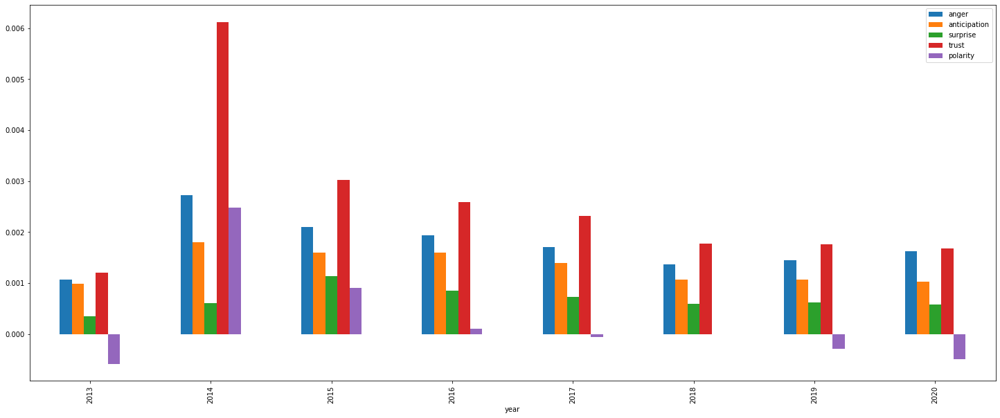

In [106]:
EMO_year.plot.bar(figsize=(25,10))

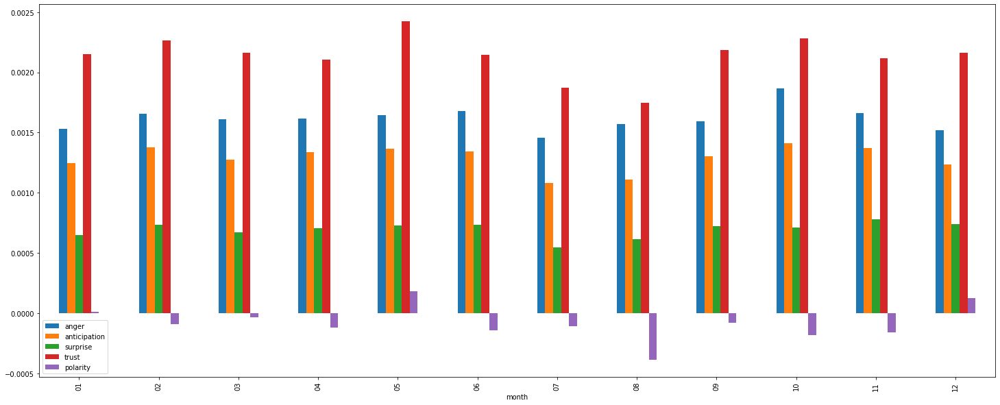

In [107]:
EMO_month.plot.bar(figsize=(25,10))

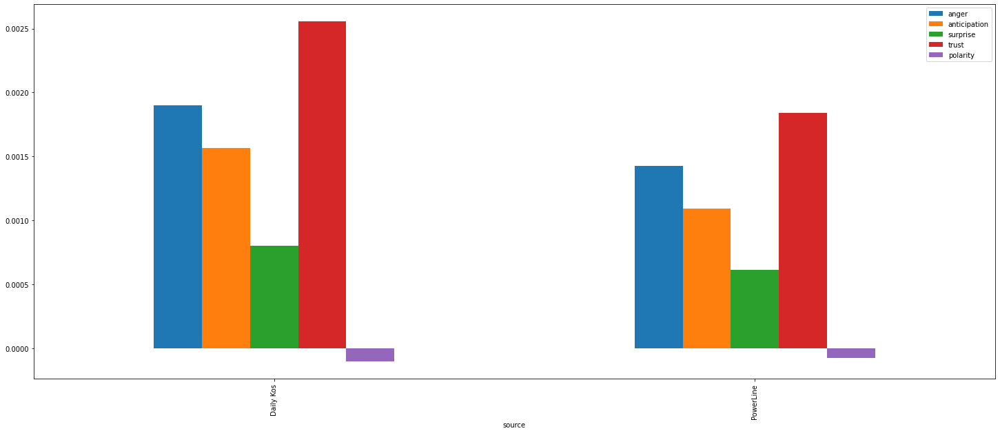

In [108]:
EMO_source.plot.bar(figsize=(25,10))

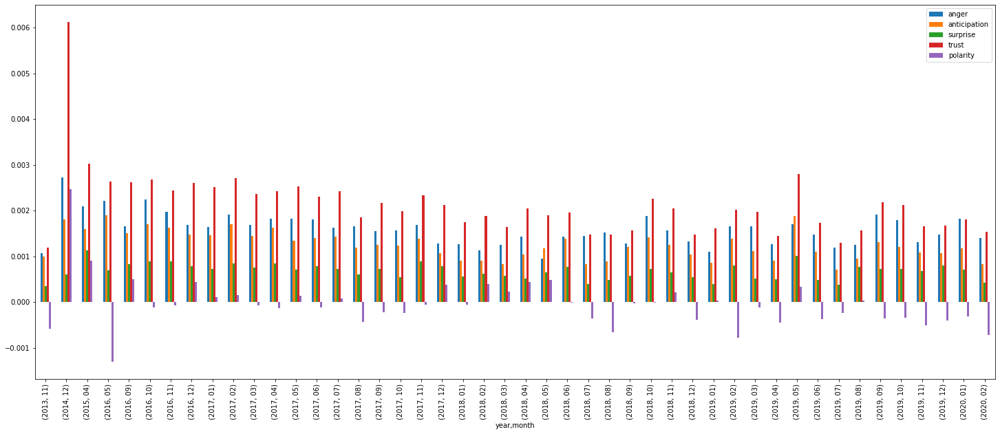

In [111]:
EMO_year_month.plot.bar(figsize=(25,10))

In [115]:
EMO_year_month.tail()

anger  anticipation  surprise     trust  polarity
year month                                                      
2019 10     0.001787      0.001205  0.000721  0.002125 -0.000346
     11     0.001315      0.001084  0.000678  0.001651 -0.000503
     12     0.001477      0.001072  0.000804  0.001667 -0.000405
2020 01     0.001820      0.001179  0.000712  0.001809 -0.000318
     02     0.001401      0.000835  0.000425  0.001534 -0.000713

### Compare Texts

Last election happend on Nov,8 2016. To compare the differences in the situation, I want to check the sentiment from the months around Nov 2016. To see how the sentiment is built up across the country before elections, ideally we should check the text from 2020 as well, however, since we are still months away from the election, such data is not included in our data source. Therefore, instead of the fall season of 2020, I also want to compare the sentiment of  2020-02, with 2016-05. Ideally the comparison should be done for the same month, however, due the limitation, these two months are chosen to represent the sentiment far ahead of election during that year. 

In [120]:
ELECTION_MAY2016 = EMO_year_month.loc['2016','05'].copy()
ELECTION_OCT2016 = EMO_year_month.loc['2016','10'].copy()
ELECTION_NOV2016 = EMO_year_month.loc['2016','11'].copy()
ELECTION_DEC2016 = EMO_year_month.loc['2016','12'].copy()
ELECTION_FEB2020 = EMO_year_month.loc['2020','02'].copy()

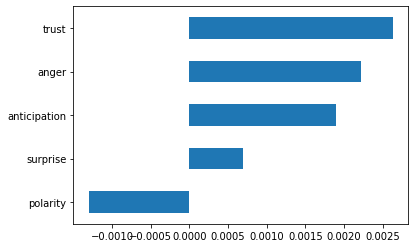

In [121]:
ELECTION_MAY2016.sort_values().plot.barh();

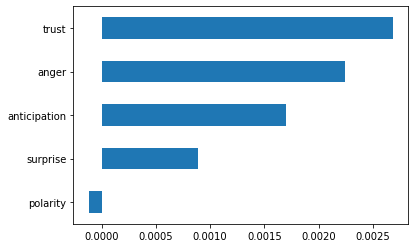

In [122]:
ELECTION_OCT2016.sort_values().plot.barh();

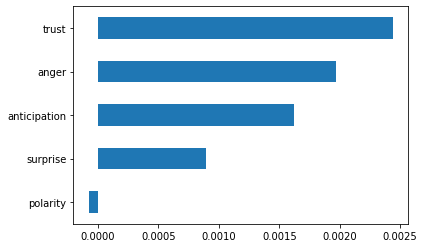

In [123]:
ELECTION_NOV2016.sort_values().plot.barh();

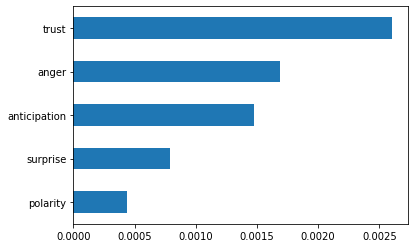

In [124]:
ELECTION_DEC2016.sort_values().plot.barh();

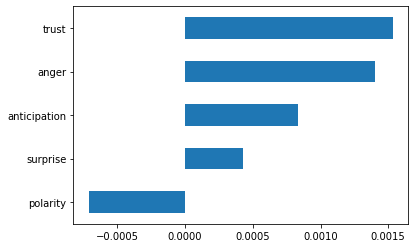

In [125]:
ELECTION_FEB2020.sort_values().plot.barh();

In [132]:
trust_words = pd.Series(SALEX[SALEX['trust'] == 1].index.tolist())
trust_words.sample(10)

913           warn
523          level
334        explain
206    cooperative
464    improvement
738     responsive
19           adore
419           hail
542        majesty
615        paragon
dtype: object

In [129]:
anger_words = pd.Series(SALEX[SALEX['anger'] == 1].index.tolist())
anger_words.sample(10)

935       ruthless
1157     vengeance
1159         venom
876          react
1055        sucker
306     derogation
165         cancer
446      falsehood
89          banish
1009          slut
dtype: object

In [130]:
anger_words = pd.Series(SALEX[SALEX['anticipation'] == 1].index.tolist())
anger_words.sample(10)

536     sensuality
650      visionary
27          ardent
508    restorative
268     graduation
312     importance
219      extricate
447       practise
22        antidote
572            sun
dtype: object

In [131]:
surprise_words = pd.Series(SALEX[SALEX['surprise'] == 1].index.tolist())
surprise_words.sample(10)

312            raving
426              veer
100        earthquake
155           gambler
368       spectacular
27              award
103          electric
439              wild
311              rave
415    uncontrollable
dtype: object

### PowerLine vs. Daily Kos

In [133]:
B_group = B.groupby(['source','year', 'month']).mean()[emo_cols]

In [134]:
B_group

anger  anticipation  surprise     trust  polarity
source    year month                                                      
Daily Kos 2013 11     0.001070      0.000991  0.000352  0.001196 -0.000587
          2014 12     0.002729      0.001801  0.000611  0.006125  0.002472
          2015 04     0.002096      0.001600  0.001133  0.003020  0.000902
          2016 05     0.002321      0.001983  0.000551  0.002753 -0.000864
               09     0.001625      0.001589  0.000809  0.002538  0.000422
...                        ...           ...       ...       ...       ...
PowerLine 2019 10     0.001830      0.001216  0.000703  0.002108 -0.000417
               11     0.001315      0.001084  0.000678  0.001651 -0.000503
               12     0.001477      0.001072  0.000804  0.001667 -0.000405
          2020 01     0.001820      0.001179  0.000712  0.001809 -0.000318
               02     0.001401      0.000835  0.000425  0.001534 -0.000713

[66 rows x 5 columns]

In [135]:
B_group_powerline = B_group.reset_index().loc[B_group.reset_index().source == 'PowerLine']
B_group_daily = B_group.reset_index().loc[B_group.reset_index().source == 'Daily Kos']

In [137]:
EMO_powerline = B_group_powerline.groupby(['year','month'])[emo_cols].mean()
EMO_daily = B_group_daily.groupby(['year','month'])[emo_cols].mean()

In [139]:
ELECTION_powerline_OCT2016 = EMO_powerline.loc['2016','10'].copy()
ELECTION_powerline_NOV2016 = EMO_powerline.loc['2016','11'].copy()
ELECTION_powerline_DEC2016 = EMO_powerline.loc['2016','12'].copy()

In [140]:
powerline_date = B_group.loc['PowerLine']
daily_date = B_group.loc['Daily Kos']

In [141]:
EMO_powerline_thin = B_group.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("source == {}".format(['PowerLine']))
EMO_daily_thin= B_group.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("source == {}".format(['Daily Kos']))

In [146]:
B_group

anger  anticipation  surprise     trust  polarity
source    year month                                                      
Daily Kos 2013 11     0.001070      0.000991  0.000352  0.001196 -0.000587
          2014 12     0.002729      0.001801  0.000611  0.006125  0.002472
          2015 04     0.002096      0.001600  0.001133  0.003020  0.000902
          2016 05     0.002321      0.001983  0.000551  0.002753 -0.000864
               09     0.001625      0.001589  0.000809  0.002538  0.000422
...                        ...           ...       ...       ...       ...
PowerLine 2019 10     0.001830      0.001216  0.000703  0.002108 -0.000417
               11     0.001315      0.001084  0.000678  0.001651 -0.000503
               12     0.001477      0.001072  0.000804  0.001667 -0.000405
          2020 01     0.001820      0.001179  0.000712  0.001809 -0.000318
               02     0.001401      0.000835  0.000425  0.001534 -0.000713

[66 rows x 5 columns]

In [145]:
EMO_powerline_thin

,source,year,month,level_3,value
115,PowerLine,2016,05,anger,0.000000
116,PowerLine,2016,05,anticipation,0.000000
117,PowerLine,2016,05,surprise,0.003954
118,PowerLine,2016,05,trust,0.000000
119,PowerLine,2016,05,polarity,-0.010853
...,...,...,...,...,...
325,PowerLine,2020,02,anger,0.001401
326,PowerLine,2020,02,anticipation,0.000835
327,PowerLine,2020,02,surprise,0.000425
328,PowerLine,2020,02,trust,0.001534


In [142]:
def plot_sentiments(df, emo='polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

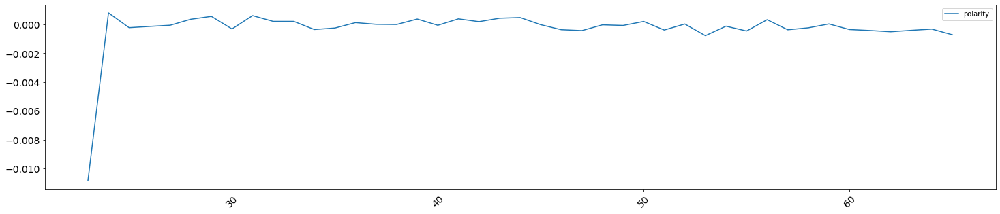

In [148]:
plot_sentiments(B_group_powerline, ['polarity'])#important graph

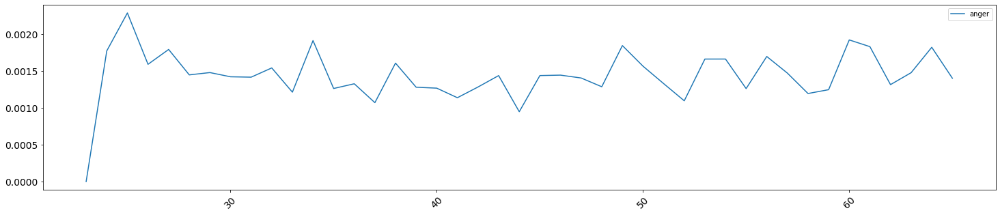

In [149]:
plot_sentiments(B_group_powerline, ['anger'])#important graph

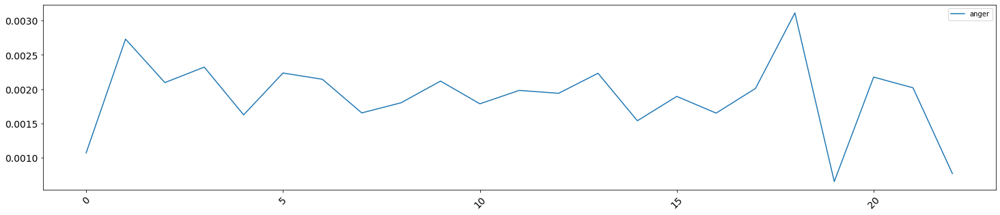

In [150]:
plot_sentiments(B_group_daily, ['anger'])#important graph

# Word Embedding

In [77]:
from gensim.models import word2vec
from sklearn.manifold import TSNE
import plotly_express as px

In [78]:
#remove stop words
VOCAB = VOCAB.loc[VOCAB.stop == 0]

In [79]:
#remove stop words from TOKEN table
TOKEN = TOKEN.loc[TOKEN.term_id.isin(VOCAB.reset_index().term_id)]

In [81]:
#list for two sources
powerline = LIB.loc[LIB.doc_source.str.contains('PowerLine')].reset_index().doc_id.to_list()
daily = LIB.loc[LIB.doc_source.str.contains('Daily')].reset_index().doc_id.to_list()

In [82]:
TOKEN = TOKEN.reset_index(drop = True)

In [83]:
TOKEN

,doc_id,sent_num,token_num,pos_tuple,pos,token_str,term_str,term_id
0,262847,0,0,"('EJ', 'NNP')",NNP,EJ,ej,10807
1,262847,0,1,"('Dionne', 'NNP')",NNP,Dionne,dionne,9610
2,262847,0,3,"('Norm', 'NNP')",NNP,Norm,norm,21572
3,262847,0,4,"('Orenstein', 'NNP')",NNP,Orenstein,orenstein,22334
4,262847,0,6,"('Thomas', 'NNP')",NNP,Thomas,thomas,31593
...,...,...,...,...,...,...,...,...
427996,308257,27,32,"('conservative', 'JJ')",JJ,conservative,conservative,7490
427997,308257,27,34,"('base', 'NN')",NN,base,base,3919
427998,308257,27,36,"('many', 'JJ')",JJ,many,many,19327
427999,308257,27,40,"('unsettled', 'VBN')",VBN,unsettled,unsettled,33199


In [84]:
TOKEN_powerline = TOKEN.loc[TOKEN.doc_id.isin(powerline)]
TOKEN_daily= TOKEN.loc[TOKEN.doc_id.isin(daily)]

In [85]:
TOKEN_daily

,doc_id,sent_num,token_num,pos_tuple,pos,token_str,term_str,term_id
0,262847,0,0,"('EJ', 'NNP')",NNP,EJ,ej,10807
1,262847,0,1,"('Dionne', 'NNP')",NNP,Dionne,dionne,9610
2,262847,0,3,"('Norm', 'NNP')",NNP,Norm,norm,21572
3,262847,0,4,"('Orenstein', 'NNP')",NNP,Orenstein,orenstein,22334
4,262847,0,6,"('Thomas', 'NNP')",NNP,Thomas,thomas,31593
...,...,...,...,...,...,...,...,...
173326,47574,8,36,"('week', 'NN')",NN,week,week,34207
173327,47574,8,37,"('progresses', 'VBZ')",VBZ,progresses,progresses,24809
173328,47574,8,44,"('updating', 'VBG')",VBG,updating,updating,33291
173329,47574,8,46,"('map', 'NN')",NN,map,map,19333


In [86]:
TOKEN_powerline['source'] = 'powerline'
TOKEN_daily['source'] = 'daily'

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [87]:
TOKEN_daily

,doc_id,sent_num,token_num,pos_tuple,pos,token_str,term_str,term_id,source
0,262847,0,0,"('EJ', 'NNP')",NNP,EJ,ej,10807,daily
1,262847,0,1,"('Dionne', 'NNP')",NNP,Dionne,dionne,9610,daily
2,262847,0,3,"('Norm', 'NNP')",NNP,Norm,norm,21572,daily
3,262847,0,4,"('Orenstein', 'NNP')",NNP,Orenstein,orenstein,22334,daily
4,262847,0,6,"('Thomas', 'NNP')",NNP,Thomas,thomas,31593,daily
...,...,...,...,...,...,...,...,...,...
173326,47574,8,36,"('week', 'NN')",NN,week,week,34207,daily
173327,47574,8,37,"('progresses', 'VBZ')",VBZ,progresses,progresses,24809,daily
173328,47574,8,44,"('updating', 'VBG')",VBG,updating,updating,33291,daily
173329,47574,8,46,"('map', 'NN')",NN,map,map,19333,daily


In [88]:
#add in title
TOKEN_powerline['doc'] = TOKEN_powerline.doc_id.map(LIB.reset_index().set_index('doc_id').doc_title)
TOKEN_daily['doc'] = TOKEN_daily.doc_id.map(LIB.reset_index().set_index('doc_id').doc_title)

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [89]:
TOKEN_daily

,doc_id,sent_num,token_num,pos_tuple,pos,token_str,term_str,term_id,source,doc
0,262847,0,0,"('EJ', 'NNP')",NNP,EJ,ej,10807,daily,Abbreviated Pundit Round-up: The erosion of no...
1,262847,0,1,"('Dionne', 'NNP')",NNP,Dionne,dionne,9610,daily,Abbreviated Pundit Round-up: The erosion of no...
2,262847,0,3,"('Norm', 'NNP')",NNP,Norm,norm,21572,daily,Abbreviated Pundit Round-up: The erosion of no...
3,262847,0,4,"('Orenstein', 'NNP')",NNP,Orenstein,orenstein,22334,daily,Abbreviated Pundit Round-up: The erosion of no...
4,262847,0,6,"('Thomas', 'NNP')",NNP,Thomas,thomas,31593,daily,Abbreviated Pundit Round-up: The erosion of no...
...,...,...,...,...,...,...,...,...,...,...
173326,47574,8,36,"('week', 'NN')",NN,week,week,34207,daily,This map shows the 48 House Democrats who've s...
173327,47574,8,37,"('progresses', 'VBZ')",VBZ,progresses,progresses,24809,daily,This map shows the 48 House Democrats who've s...
173328,47574,8,44,"('updating', 'VBG')",VBG,updating,updating,33291,daily,This map shows the 48 House Democrats who've s...
173329,47574,8,46,"('map', 'NN')",NN,map,map,19333,daily,This map shows the 48 House Democrats who've s...


In [90]:
LIB = LIB.set_index('doc_id')

In [91]:
LIB

,doc_title,year,month,doc_source
doc_id,,,,
262847,Abbreviated Pundit Round-up: The erosion of no...,2017,9,Daily Kos
117595,Chris Hayes' latest book examines the ongoing ...,2017,4,Daily Kos
40272,Trump knows U.S. intelligence agencies are wro...,2017,1,Daily Kos
60928,Sen. Al Franken asked Republicans to do their ...,2017,2,Daily Kos
93772,"Ignorant, unskilled, sick, hungry, cruel and v...",2017,3,Daily Kos
...,...,...,...,...
220417,“Would I have done the same?”,2017,8,PowerLine
727680,Can Sandmann Win?,2019,3,PowerLine
678085,What we have learned so far (6) [With Comment ...,2019,1,PowerLine


In [92]:
TOKEN_powerline['year'] = TOKEN_powerline.doc_id.map(LIB.year)
TOKEN_powerline['source'] = TOKEN_powerline.doc_id.map(LIB.doc_source)
TOKEN_powerline['month'] = TOKEN_powerline.doc_id.map(LIB.month)

TOKEN_daily['year'] = TOKEN_daily.doc_id.map(LIB.year)
TOKEN_daily['source'] = TOKEN_daily.doc_id.map(LIB.doc_source)
TOKEN_daily['month'] = TOKEN_daily.doc_id.map(LIB.month)

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to b

In [94]:
TOKEN_powerline.head()

,doc_id,sent_num,token_num,pos_tuple,pos,token_str,term_str,term_id,source,doc,year,month
173331,964824,0,0,"('Democrats', 'NNPS')",NNPS,Democrats,democrats,9092,PowerLine,The Never-Ending Impeachment,2019,12
173332,964824,0,3,"('talking', 'VBG')",VBG,talking,talking,30974,PowerLine,The Never-Ending Impeachment,2019,12
173333,964824,0,5,"('impeaching', 'VBG')",VBG,impeaching,impeaching,15897,PowerLine,The Never-Ending Impeachment,2019,12
173334,964824,0,6,"('President', 'NNP')",NNP,President,president,24496,PowerLine,The Never-Ending Impeachment,2019,12
173335,964824,0,7,"('Trump', 'NNP')",NNP,Trump,trump,32366,PowerLine,The Never-Ending Impeachment,2019,12


In [95]:
OHCO = ['doc', 'sent_num', 'token_num']
BAG = OHCO[:1] # document

In [96]:
TOKEN_powerline = TOKEN_powerline.set_index(OHCO)
TOKEN_daily = TOKEN_daily.set_index(OHCO)

In [114]:
 #remove proper noun, plural
corpus_powerline = TOKEN_powerline [~TOKEN_powerline .pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.astype(str).tolist())\
    .reset_index()['term_str'].tolist()

In [115]:
corpus_daily = TOKEN_daily[~TOKEN_daily.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [99]:
window = 5

In [118]:
model_powerline = word2vec.Word2Vec(corpus_powerline, size=246, window=window, min_count=200, workers=4)

In [117]:
model_daily = word2vec.Word2Vec(corpus_daily, size=246, window=window, min_count=200, workers=4)

In [120]:
coords_powerline = pd.DataFrame(index=range(len(model_powerline.wv.vocab)))
coords_powerline['term_str'] = [w for w in model_powerline.wv.vocab]
coords_powerline['vector'] = coords_powerline['term_str'].apply(lambda x: model_powerline.wv.get_vector(x))

In [121]:
coords_powerline.head()

,term_str,vector
0,2016,"[-0.12044745, -0.101209, 0.082410894, -0.00683..."
1,need,"[-0.11556387, -0.091278024, 0.08683682, -0.006..."
2,last,"[-0.118145466, -0.09164461, 0.08587453, -0.008..."
3,year,"[-0.11569094, -0.087117255, 0.08000164, -0.008..."
4,information,"[-0.111783594, -0.09934524, 0.080475494, -0.00..."


In [122]:
coords_daily = pd.DataFrame(index=range(len(model_daily.wv.vocab)))
coords_daily['term_str'] = [w for w in model_daily.wv.vocab]
coords_daily['vector'] = coords_daily['term_str'].apply(lambda x: model_daily.wv.get_vector(x))

In [123]:
coords_daily.head()

,term_str,vector
0,go,"[-0.06314464, -0.047522083, 0.07104907, 0.0140..."
1,according,"[-0.06783443, -0.050110046, 0.0762076, 0.01442..."
2,still,"[-0.06425639, -0.050185315, 0.07720669, 0.0127..."
3,says,"[-0.061555546, -0.049536377, 0.070157506, 0.01..."
4,people,"[-0.066626795, -0.049013685, 0.073491804, 0.01..."


In [124]:
tsne_model_powerline = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_values_powerline = tsne_model_powerline.fit_transform(coords_powerline['vector'].tolist())

In [125]:
coords_powerline['x'] = tsne_values_powerline[:,0]
coords_powerline['y'] = tsne_values_powerline[:,1]

In [126]:
coords_powerline.head()

,term_str,vector,x,y
0,2016,"[-0.12044745, -0.101209, 0.082410894, -0.00683...",-1.732350,4.047561
1,need,"[-0.11556387, -0.091278024, 0.08683682, -0.006...",0.529658,0.034844
2,last,"[-0.118145466, -0.09164461, 0.08587453, -0.008...",0.177154,0.736164
3,year,"[-0.11569094, -0.087117255, 0.08000164, -0.008...",-1.840259,-0.219785
4,information,"[-0.111783594, -0.09934524, 0.080475494, -0.00...",-0.757012,4.636588


In [127]:
tsne_model_daily = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_values_daily = tsne_model_daily.fit_transform(coords_daily['vector'].tolist())

In [128]:
coords_daily['x'] = tsne_values_daily[:,0]
coords_daily['y'] = tsne_values_daily[:,1]

In [129]:
coords_daily.head()

,term_str,vector,x,y
0,go,"[-0.06314464, -0.047522083, 0.07104907, 0.0140...",-6.954246,-5.624061
1,according,"[-0.06783443, -0.050110046, 0.0762076, 0.01442...",-3.276707,-5.298511
2,still,"[-0.06425639, -0.050185315, 0.07720669, 0.0127...",-2.992783,-5.489289
3,says,"[-0.061555546, -0.049536377, 0.070157506, 0.01...",-6.852020,-5.863503
4,people,"[-0.066626795, -0.049013685, 0.073491804, 0.01...",-4.224860,-5.985321


In [130]:
coords_daily.to_csv('coords_daily.csv')
coords_powerline.to_csv('coords_powerline.csv')

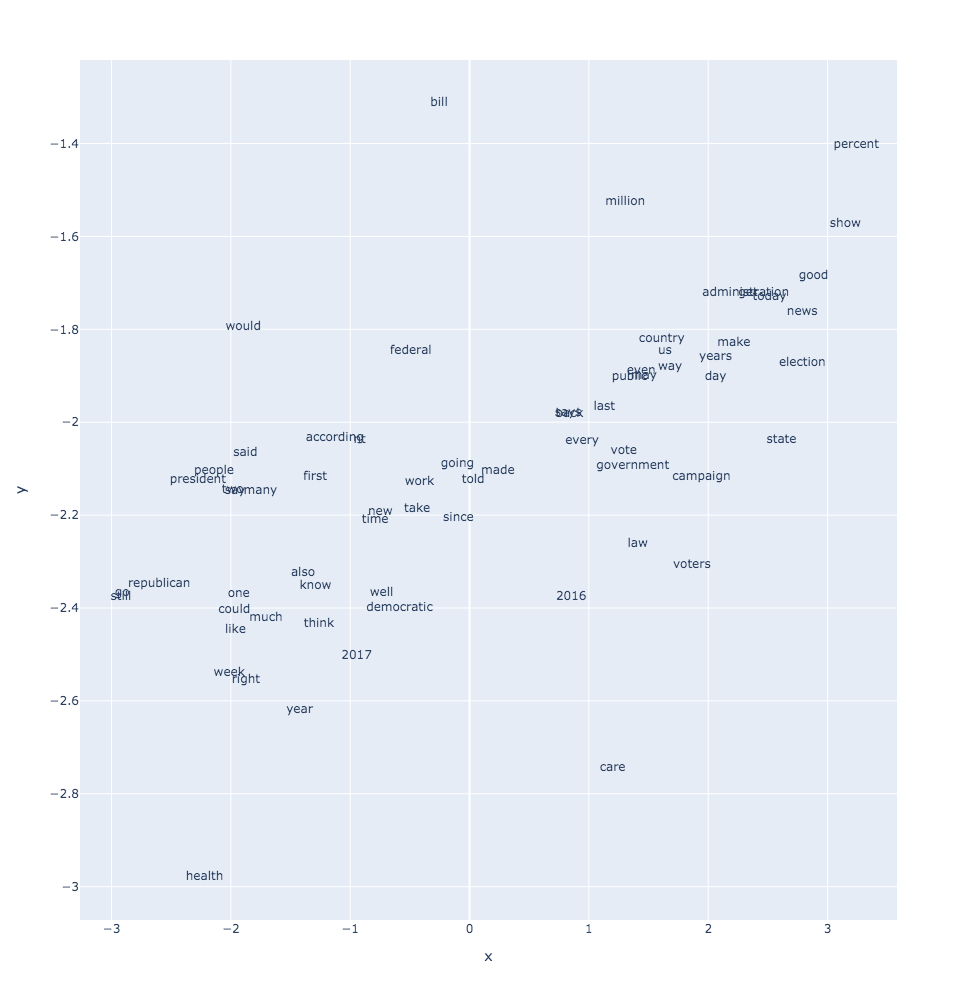

In [96]:
px.scatter(coords_daily, 'x', 'y', text='label', height=1000).update_traces(mode='text')

In [158]:
def analogy_powerline(A, B, C, n=2):
    try:
        return model_powerline.wv.most_similar(positive=[B, C], negative=[A])[0:n]
    except KeyError as e:
        print('Error:', e)
        return None

In [159]:
def analogy_daily(A, B, C, n=2):
    try:
        return model_daily.wv.most_similar(positive=[B, C], negative=[A])[0:n]
    except KeyError as e:
        print('Error:', e)
        return None

In [161]:
analogy_powerline('2016', 'election', 'president')

[('let', 0.9996554851531982), ('policy', 0.9996533989906311)]

In [162]:
analogy_daily('2016', 'election', 'president')

[('2017', 0.9997525215148926), ('said', 0.9997516870498657)]

# LDA

In [131]:
n_terms = 4000
n_topics = 10
max_iter = 5
OHCO = ['doc_id', 'sent_num']

In [132]:
from sklearn.feature_extraction.text import CountVectorizer #document-term matrix count
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [133]:
SENT = TOKEN[TOKEN.pos.str.match(r'^NNS?$')].groupby(OHCO)\
        .term_str.apply(lambda x: ' '.join(x.astype(str)))\
        .to_frame().rename(columns={'term_str':'sent_str'})

In [134]:
SENT.head()

sent_str
doc_id sent_num                                                   
106    1                                            economist plan
       2         estimates economist winners losers professor f...
       3                                                    advice
       4                      experts people terms policy policies
       5                                       premium factor cost

### Create Vector space

In [135]:
tfv = CountVectorizer(max_features=n_terms, stop_words='english')
tf = tfv.fit_transform(SENT.sent_str)
TERMS = tfv.get_feature_names()

### Generate Model

In [136]:
lda = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

**THETA**

In [137]:
THETA = pd.DataFrame(lda.fit_transform(tf), index=SENT.index)
THETA.columns.name = 'topic_id'

In [138]:
THETA.head(20).style.background_gradient()

In [140]:
THETA.to_csv('THETA.csv')

**PHI**

In [141]:
PHI = pd.DataFrame(lda.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'
#phi table - language model

In [142]:
PHI.T.sample(20).style.background_gradient()

topic_id,0,1,2,3,4,5,6,7,8,9
term_str,,,,,,,,,,
executive,0.501269,17.697635,8.747152,1.474570,15.165072,0.100054,73.143157,11.829986,1.058486,9.282620
batteries,0.100000,0.100000,1.209575,0.100000,0.100000,0.100000,0.100007,0.100032,0.100001,4.990385
reading,41.366843,0.141406,0.100007,0.100003,0.100003,0.155140,0.104021,2.755957,4.076619,0.100003
fights,0.100007,0.100008,0.100000,7.809012,0.100011,0.100000,0.100016,1.390941,0.100002,0.100002
tshirt,0.100000,0.100000,0.100350,0.100000,0.100000,0.100000,0.129148,3.099644,0.115676,6.055182
web,0.100000,0.100028,2.153470,0.124740,0.100000,0.100002,0.100000,0.100009,0.100022,8.021728
symbol,0.100002,0.100000,0.100017,0.100000,2.099971,0.100000,0.100003,5.100013,0.100000,1.099994
videos,0.100009,0.100000,0.100002,19.099434,0.100010,0.100000,0.100007,0.100530,0.100002,0.100004
newspapers,0.100007,0.100010,0.100012,0.100004,0.100000,11.317488,0.100001,5.514249,2.468226,0.100003


In [144]:
PHI.T.to_csv('PHI.csv')

### Inspect Result 
#### Get Terms per Topic

In [117]:
TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)

In [118]:
TOPICS

term_str,0,1,2,3,4,5,6,7,8,9
topic_id,,,,,,,,,,
0,people,book,days,immigration,votes,number,reason,place,state,way
1,time,investigation,day,years,question,decision,today,staff,article,version
2,thing,team,law,game,friends,politics,information,sources,campaign,sense
3,members,things,person,health,care,press,media,job,administration,life
4,government,election,state,world,point,evidence,way,today,police,problem
5,percent,course,vote,policy,meeting,woman,states,poll,administration,death
6,administration,times,president,fact,week,history,statement,yesterday,men,people
7,campaign,year,president,man,work,money,school,debate,months,questions
8,case,story,voters,position,news,change,climate,matter,kind,party


In [119]:
TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)

### Sort Topic By DOC weight

In [120]:
TOPICS['doc_weight_sum'] = THETA.sum()

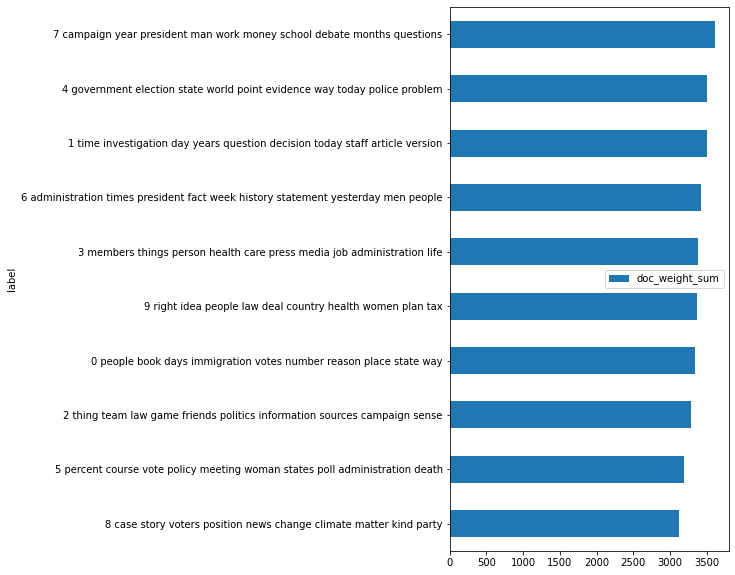

In [121]:
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10))

### Explore Topic by Source

In [122]:
topic_cols = [t for t in range(n_topics)]
SOURCE = THETA.join(LIB, on='doc_id')\
    .reset_index().set_index(['doc_source']+OHCO)\
    .groupby('doc_source')[topic_cols].mean()\
    .T                                            
SOURCE.index.name = 'topic_id'

In [123]:
SOURCE['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

In [124]:
SOURCE.sort_values('Daily Kos', ascending=False).style.background_gradient()

doc_source,Daily Kos,PowerLine,topterms
topic_id,,,
9,0.116602,0.089686,right idea people law deal country health women plan tax
3,0.108893,0.094646,members things person health care press media job administration life
7,0.108326,0.106528,campaign year president man work money school debate months questions
4,0.106416,0.102530,government election state world point evidence way today police problem
5,0.099803,0.091643,percent course vote policy meeting woman states poll administration death
0,0.099535,0.098819,people book days immigration votes number reason place state way
6,0.098318,0.103107,administration times president fact week history statement yesterday men people
1,0.097406,0.107588,time investigation day years question decision today staff article version
2,0.085813,0.104567,thing team law game friends politics information sources campaign sense


In [125]:
SOURCE.sort_values('PowerLine', ascending=False).style.background_gradient()

doc_source,Daily Kos,PowerLine,topterms
topic_id,,,
1,0.097406,0.107588,time investigation day years question decision today staff article version
7,0.108326,0.106528,campaign year president man work money school debate months questions
2,0.085813,0.104567,thing team law game friends politics information sources campaign sense
6,0.098318,0.103107,administration times president fact week history statement yesterday men people
4,0.106416,0.102530,government election state world point evidence way today police problem
8,0.078889,0.100885,case story voters position news change climate matter kind party
0,0.099535,0.098819,people book days immigration votes number reason place state way
3,0.108893,0.094646,members things person health care press media job administration life
5,0.099803,0.091643,percent course vote policy meeting woman states poll administration death


In [126]:
SOURCE.to_csv('SOURCE.csv')

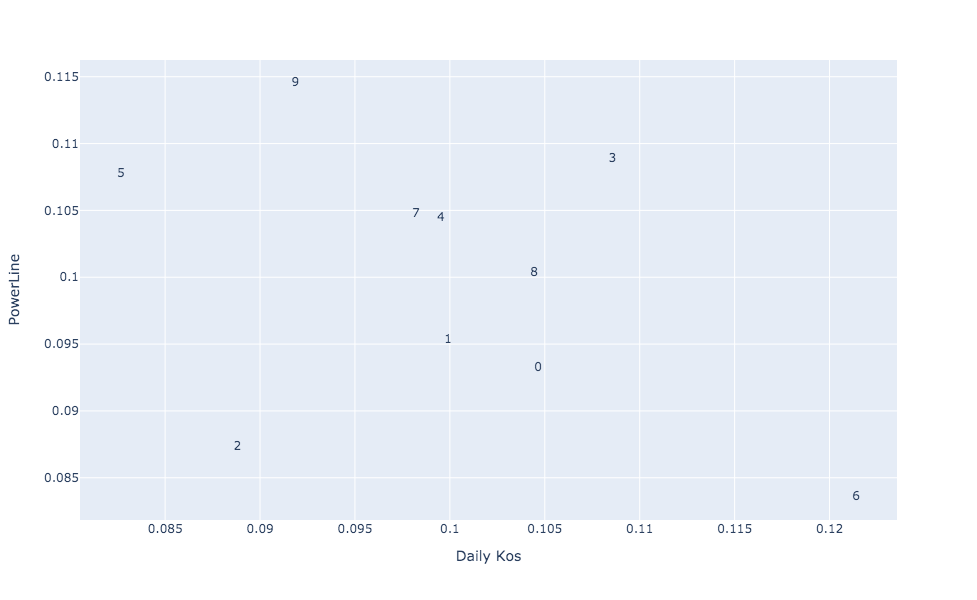

In [306]:
px.scatter(SOURCE.reset_index(), 'Daily Kos', 'PowerLine', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

### Cluster Topic

In [128]:
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt

In [129]:
def plot_tree(tree, labels):
    plt.figure()
    fig, axes = plt.subplots(figsize=(5, 10))
    dendrogram = sch.dendrogram(tree, labels=labels, orientation="left")
    plt.tick_params(axis='both', which='major', labelsize=14)

In [130]:
SIMS = pdist(normalize(PHI), metric='euclidean')
TREE = sch.linkage(SIMS, method='ward')

In [131]:
labels  = ["{}: {}".format(a,b) for a, b in zip(SOURCE.index,  SOURCE.topterms.tolist())]

<Figure size 432x288 with 0 Axes>

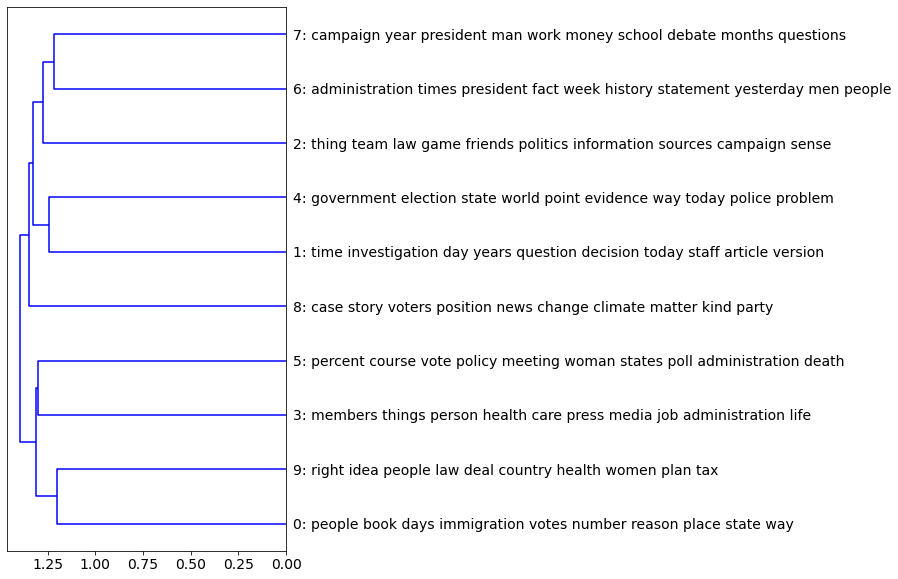

In [132]:
plot_tree(TREE, labels)

In [135]:
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

In [145]:
p = pyLDAvis.sklearn.prepare(lda, tf, tfv, sort_topics = False)

In [146]:
pyLDAvis.save_html(p, 'pyLDA_file.html')

In [163]:
p

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.126624  0.007854       1        1   9.543468
1      0.053551  0.089567       2        1  10.332195
2      0.125326  0.107765       3        1   9.211056
3     -0.137396 -0.039041       4        1  10.096650
4      0.067299  0.024897       5        1  10.398748
5     -0.118636 -0.137689       6        1   9.297335
6     -0.024309  0.012526       7        1  10.623178
7      0.063463  0.138250       8        1  10.505202
8      0.210971 -0.222876       9        1   9.578224
9     -0.113645  0.018749      10        1  10.413945, topic_info=          Term         Freq        Total Category  logprob  loglift
2585    people  1248.000000  1248.000000  Default  30.0000  30.0000
2586   percent   508.000000   508.000000  Default  29.0000  29.0000
525       case   577.000000   577.000000  Default  28.0000  28.0000
3450     story   565.000000   565.000000  Default  27.0000  27.0000
3658      time   941.000000   941.000000  Default  26.0000  26.0000
...        ...          ...          ...      ...      ...      ...
518       care    91.710343   271.107222  Topic10  -4.9894   1.1781
2321   morning    69.703043   214.193330  Topic10  -5.2638   1.1394
2197    matter    68.090935   262.505702  Topic10  -5.2872   0.9126
3423    states    67.007446   279.419187  Topic10  -5.3032   0.8341
3475  students    60.727789   182.835821  Topic10  -5.4016   1.1598

[677 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
0         1  0.912222      1960s
0         2  0.057014      1960s
1         9  0.970525        326
3         9  0.970525        580
6         1  0.068111    ability
...     ...       ...        ...
3994      7  0.724218  yesterday
3994     10  0.010200  yesterday
3996      3  0.053792      youth
3996      5  0.053792      youth
3996     10  0.860669      youth

[2146 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])